# Chapter 6 : Training reasoning models with reinforcement learning

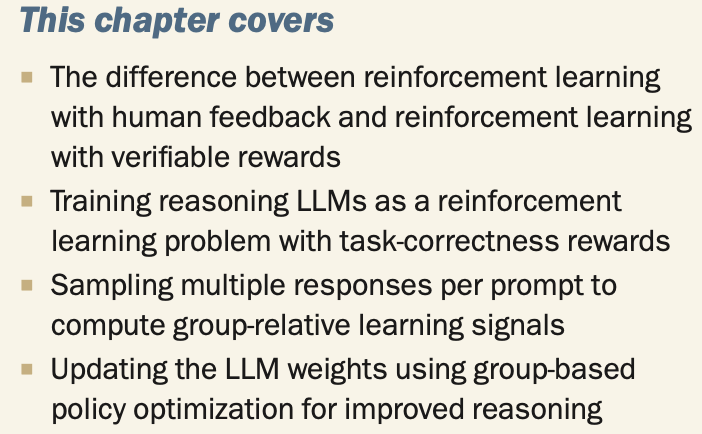


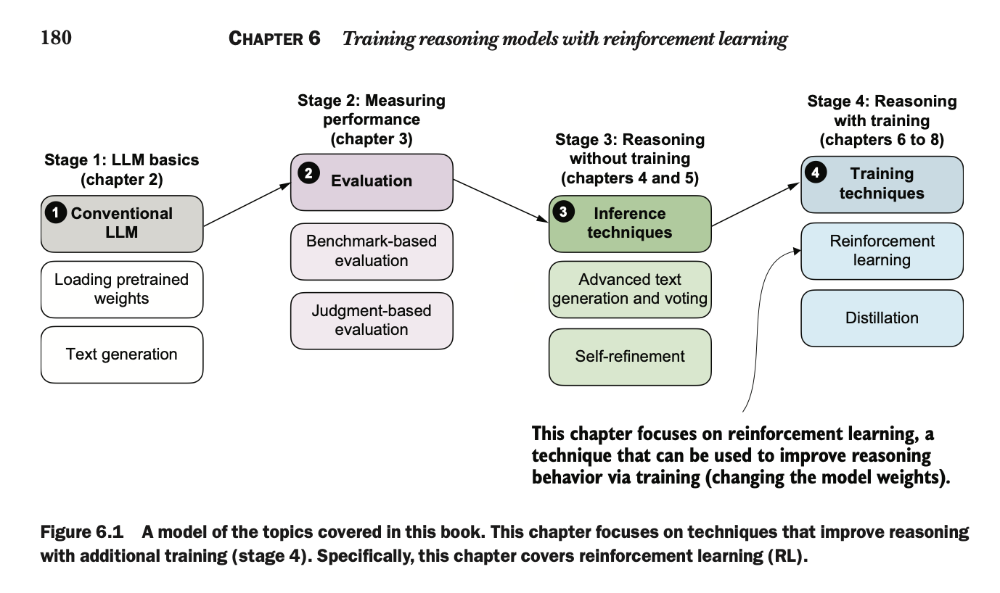


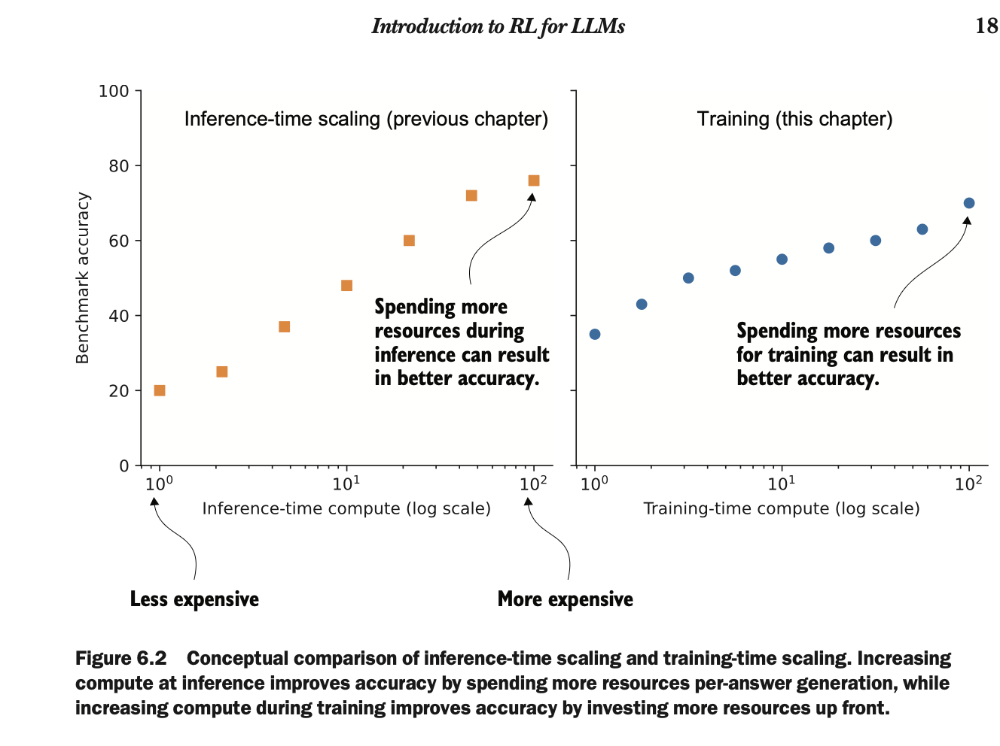
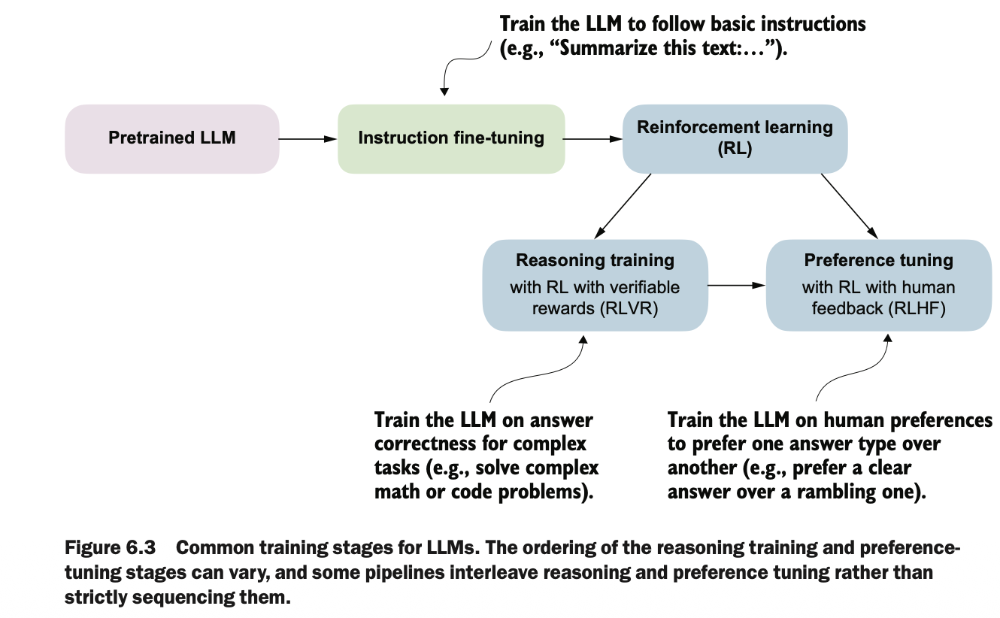


<p>Applying RL on top of a pretrained model is attractive because it lets us optimize
whole outputs, such as answer correctness or preferences, rather than individual
tokens and next-token prediction. In this sense, pretraining mainly builds knowl-
edge, while RL shapes how the model uses that knowledge, including its reasoning
behavior.</p>


# 6.1.1 The original RL pipeline with human feedback (RLHF)

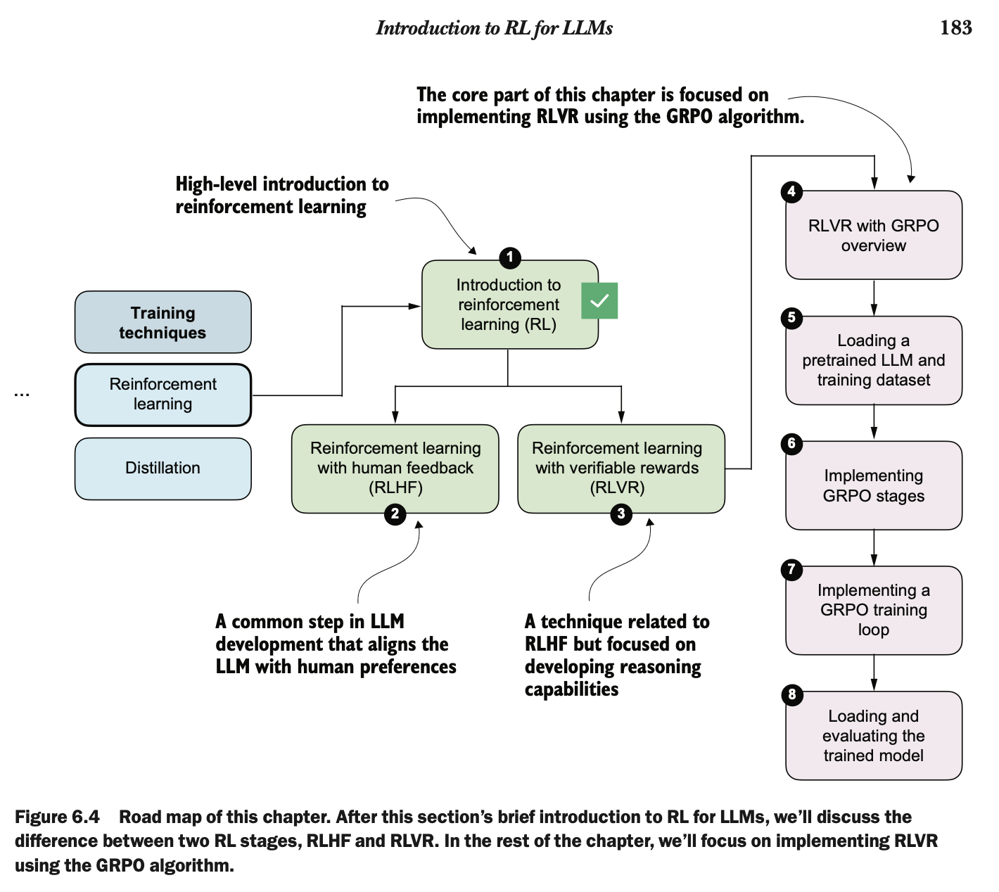


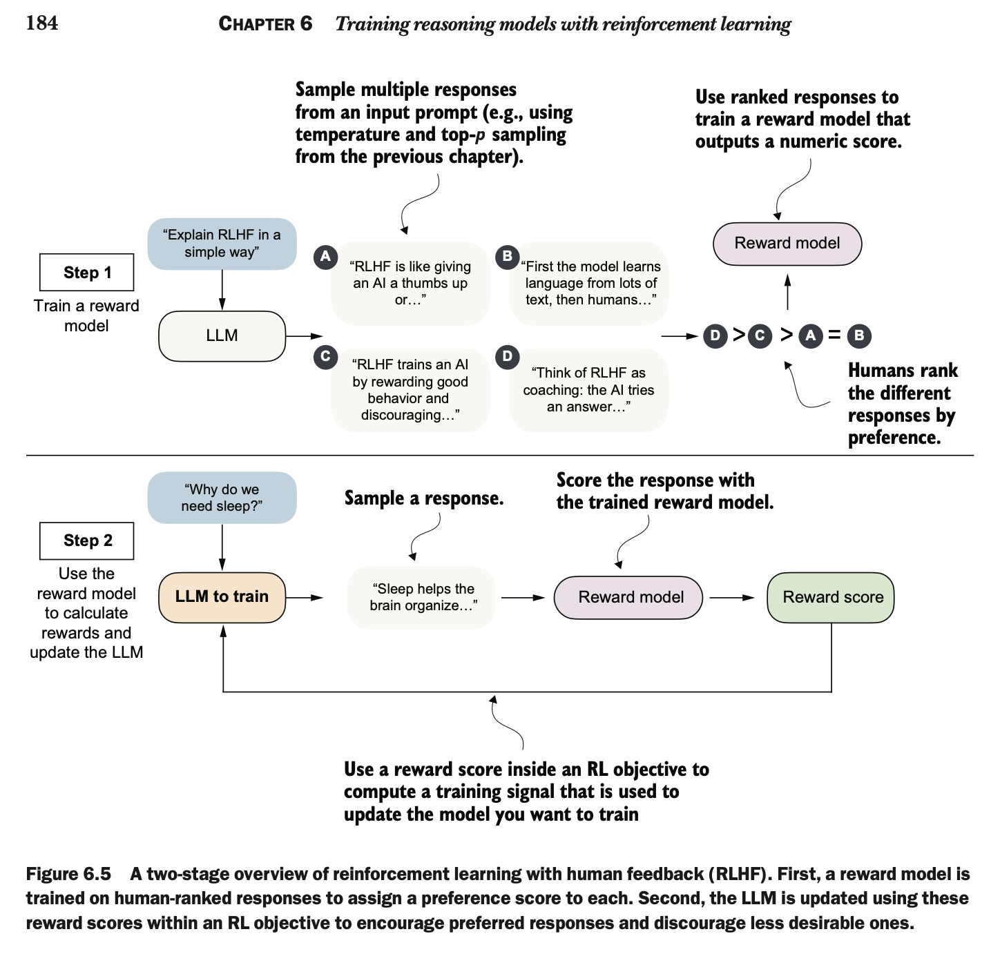


# 6.1.2 : From human feedback to verifiable rewards

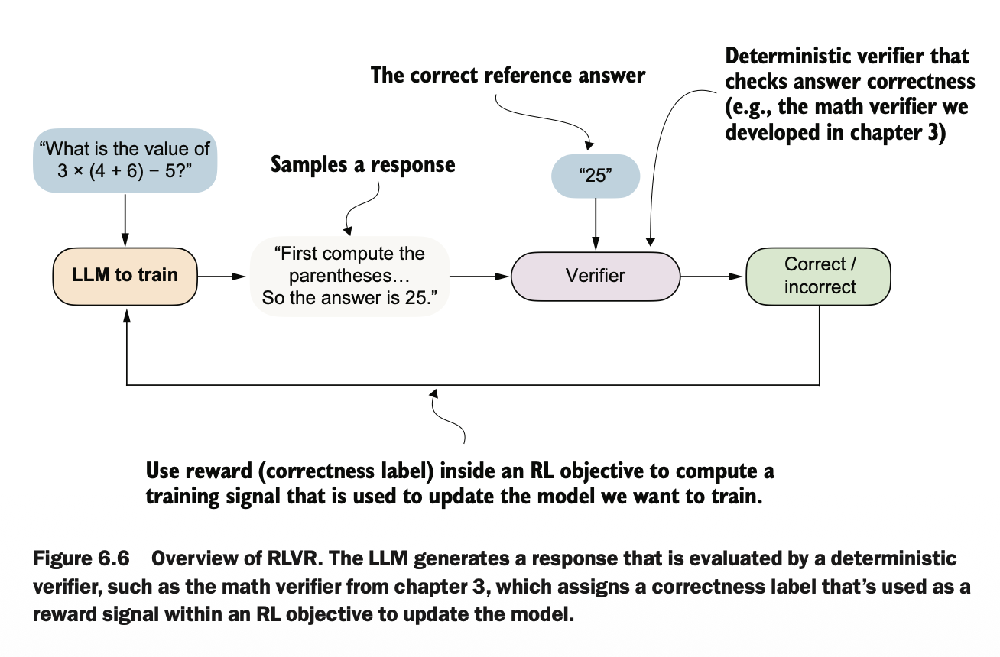


## To summarize, RLVR offers several practical advantages over RLHF :

- First, it removes the need to train and maintain a separate reward model, which is often comparable in size and cost to the base LLM.

- Second, RLVR requires access to reliable verification signals, which restricts it to certain domains, such as math and code. But verifiable rewards are deterministic and reproducible, meaning they produce the same result every time for the same output, which avoids the noise and inconsistency that arise in human preference annotations.

- Finally, RLVR scales naturally to large training sets because, given a reference solution, rewards can be computed automatically for any number of model-generated answers without additional human labeling effort.


# 6.2 RLVR using GRPO

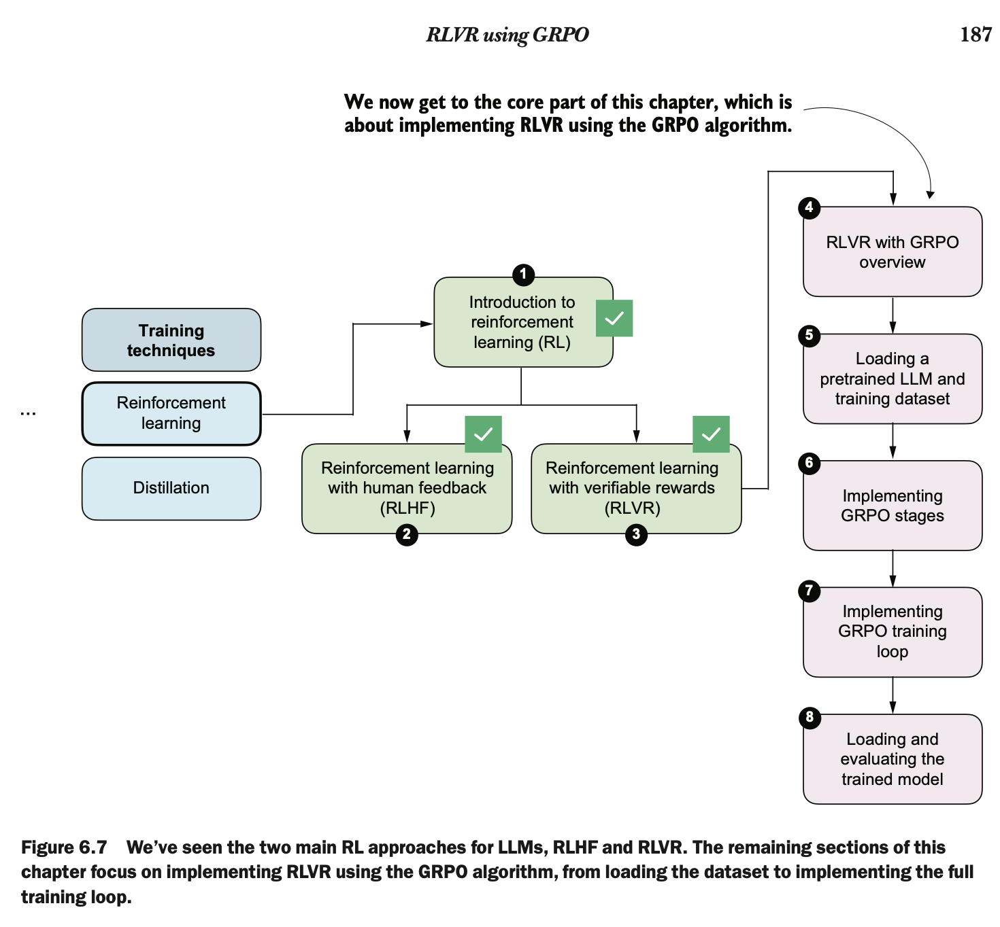
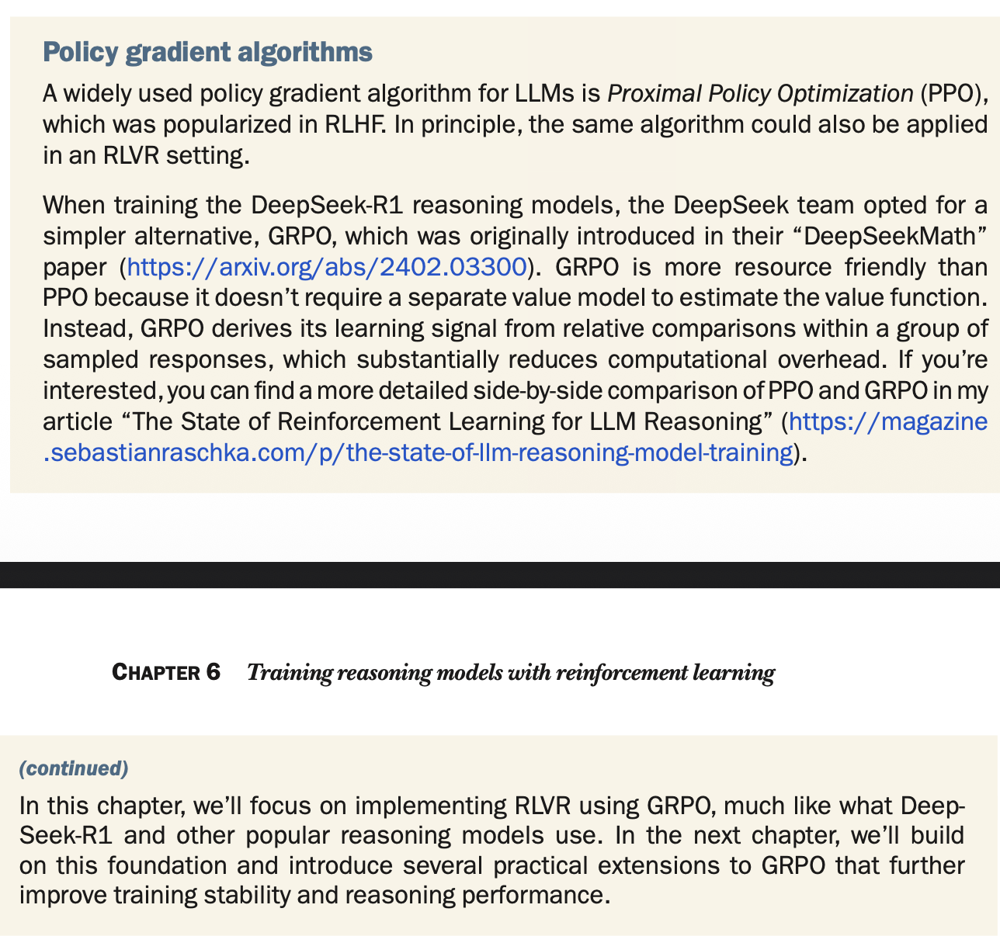


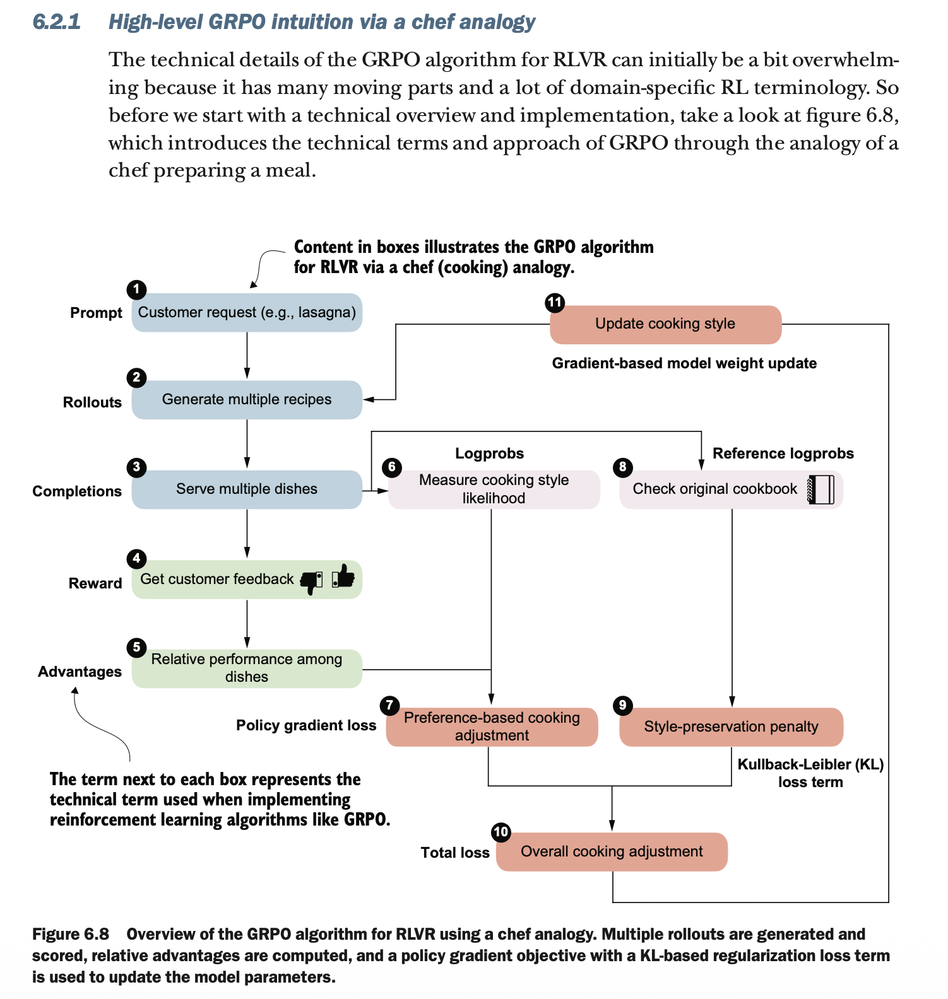


# 6.2.2 The high-level GRPO procedure

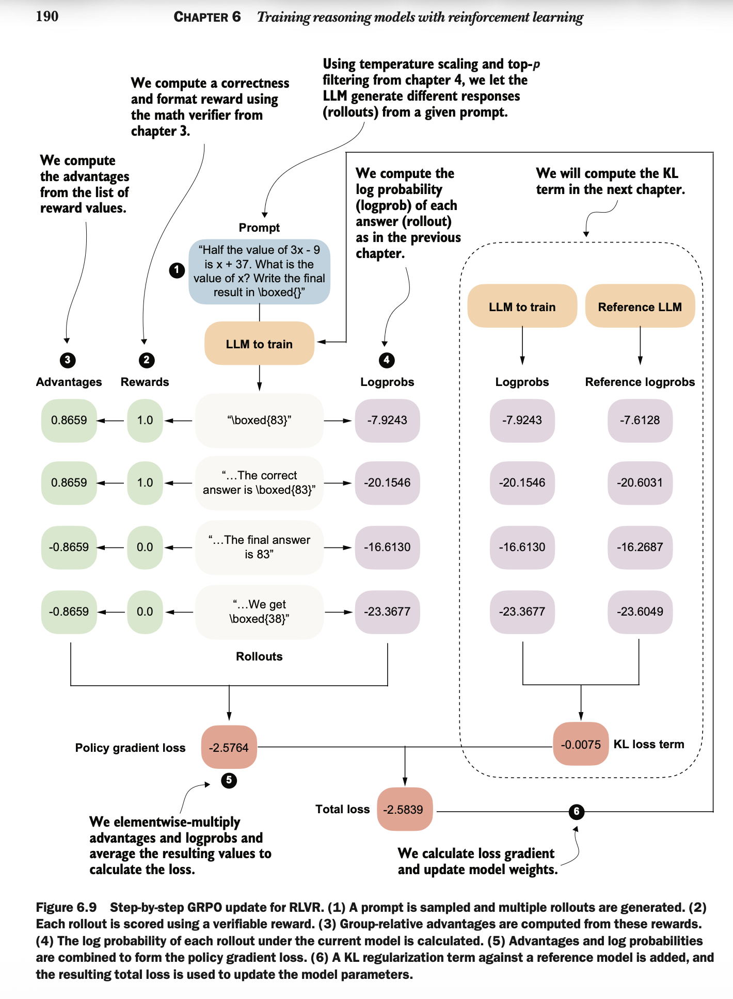


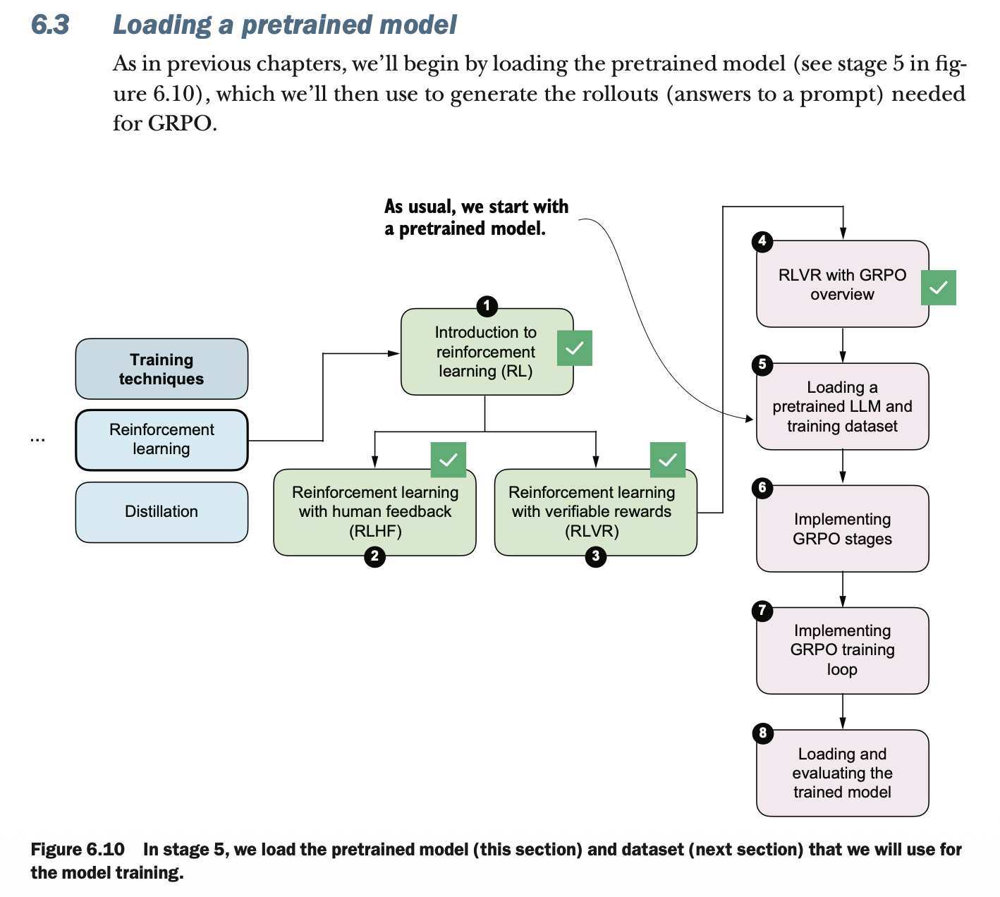


In [ ]:
import torch

from reasoning_from_scratch.ch02 import get_device
from reasoning_from_scratch.ch03 import load_model_and_tokenizer

device = get_device()
device = torch.device("cpu")

model, tokenizer = load_model_and_tokenizer(
    which_model="base", device=device, use_compile=False
)

Using Apple Silicon GPU (MPS)
✓ qwen3/qwen3-0.6B-base.pth already up-to-date


In [2]:
from reasoning_from_scratch.ch03 import render_prompt
from reasoning_from_scratch.ch04 import (
    generate_text_stream_concat_flex,
    generate_text_top_p_stream_cache,
)

raw_prompt = "Half the value of $3x-9$ is $x+37$. " "What is the value of $x$?"
prompt = render_prompt(raw_prompt)

torch.manual_seed(0)
response = generate_text_stream_concat_flex(
    model,
    tokenizer,
    prompt,
    device,
    max_new_tokens=2048,
    verbose=True,
    generate_func=generate_text_top_p_stream_cache,
    temperature=0.9,
    top_p=0.9,
)

 47

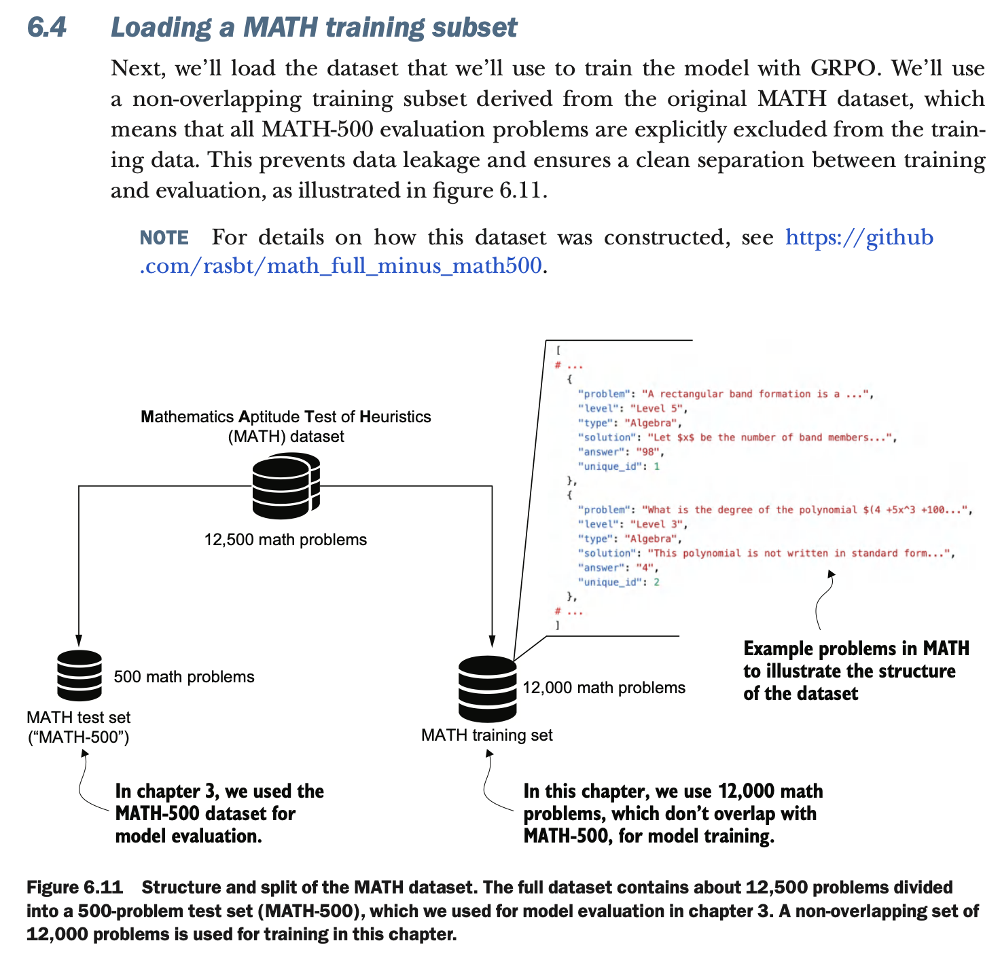


In [3]:
# Listing 6.3 Loading the MATH training set

import json
import requests
from pathlib import Path


def load_math_train(local_path="math_train.json", save_copy=True):
    local_path = Path(local_path)

    url = (
        "https://raw.githubusercontent.com/rasbt/"
        "math_full_minus_math500/refs/heads/main/"
        "math_full_minus_math500.json"
    )
    backup_url = (
        "https://f001.backblazeb2.com/file/reasoning-from-scratch/"
        "MATH/math_full_minus_math500.json"
    )

    if local_path.exists():
        with local_path.open("r", encoding="utf-8") as f:
            data = json.load(f)
    else:
        try:
            r = requests.get(url, timeout=30)
            r.raise_for_status()
        except requests.RequestException:
            print("Using backup URL.")
            r = requests.get(backup_url, timeout=30)
            r.raise_for_status()

        data = r.json()

        if save_copy:
            with local_path.open("w", encoding="utf-8") as f:
                json.dump(data, f, indent=2)

    return data

In [4]:
math_train = load_math_train()

print("Dataset size:", len(math_train))

Dataset size: 12000


In [5]:
from pprint import pprint

pprint(math_train[4])

{'answer': '6',
 'level': 'Level 3',
 'problem': 'Sam is hired for a 20-day period. On days that he works, he earns '
            '$\\$$60. For each day that he does not work, $\\$$30 is '
            'subtracted from his earnings. At the end of the 20-day period, he '
            'received $\\$$660. How many days did he not work?',
 'solution': 'Call $x$ the number of days Sam works and $y$ the number of days '
             'he does not. We can set up the following system of equations to '
             'represent the given information: \\begin{align*}\n'
             'x+y &= 20 \\\\\n'
             '60x - 30y &= 660 \\\\\n'
             '\\end{align*} The first equation represents the total number of '
             'days Sam works, and the second equation represents his total '
             'profit. Solving for $x$ in the first equation yields $x = 20 - '
             'y$. Substituting into the second equation gives $60(20-y) - 30y '
             '= 660$. Canceling a factor of $10$ an

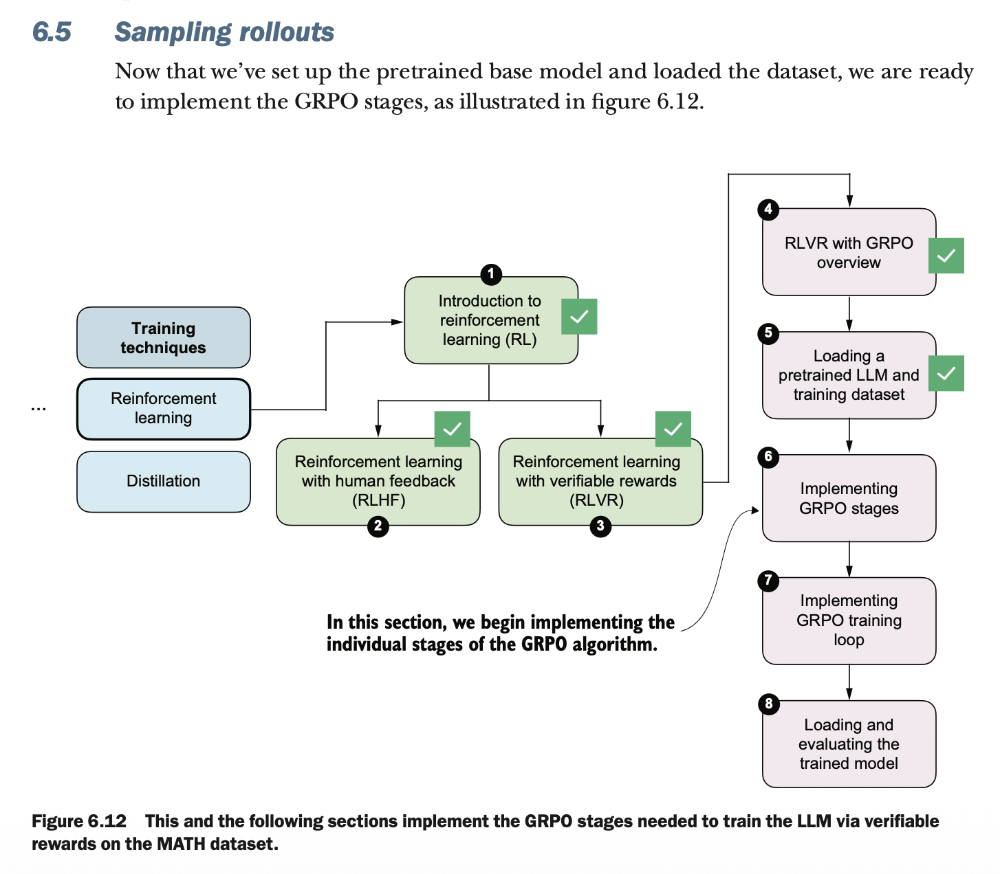


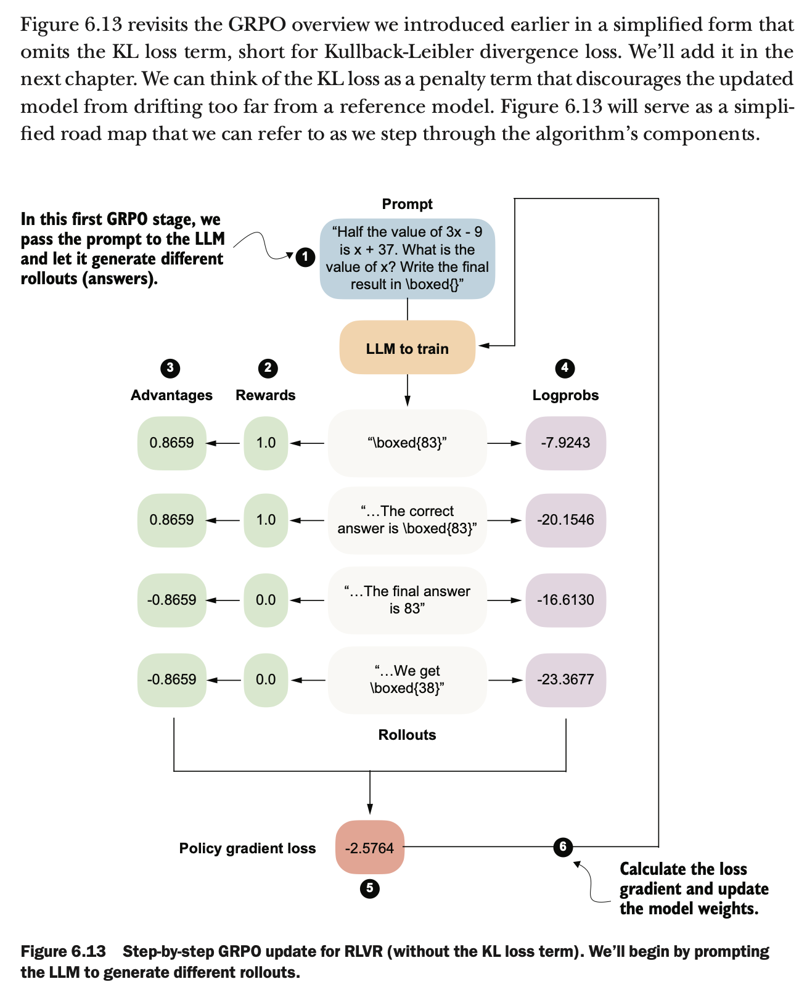


In [6]:
# Listing 6.4 Defining the rollout generation function
from reasoning_from_scratch.qwen3 import KVCache
from reasoning_from_scratch.ch04 import top_p_filter


@torch.no_grad()
def sample_response(
    model,
    tokenizer,
    prompt,
    device,
    max_new_tokens=512,
    temperature=0.8,
    top_p=0.9,
):
    input_ids = torch.tensor(tokenizer.encode(prompt), device=device)

    cache = KVCache(n_layers=model.cfg["n_layers"])
    model.reset_kv_cache()
    logits = model(input_ids.unsqueeze(0), cache=cache)[:, -1]

    generated = []
    for _ in range(max_new_tokens):
        if temperature and temperature != 1.0:
            logits = logits / temperature

        probas = torch.softmax(logits, dim=-1)
        probas = top_p_filter(probas, top_p)
        next_token = torch.multinomial(probas.cpu(), num_samples=1).to(device)

        token_id = next_token.item()
        generated.append(token_id)

        if tokenizer.eos_token_id is not None and token_id == tokenizer.eos_token_id:
            break
        logits = model(next_token, cache=cache)[:, -1]

    full_token_ids = torch.cat(
        [
            input_ids,
            torch.tensor(generated, device=device, dtype=input_ids.dtype),
        ]
    )
    return full_token_ids, input_ids.numel(), tokenizer.decode(generated)

In [7]:
# Listing 6.5 Generating rollouts with temperature scaling and top-p sampling
from reasoning_from_scratch.ch06 import sample_response

torch.manual_seed(0)

raw_prompt = "Half the value of $3x-9$ is $x+37$. " "What is the value of $x$?"
prompt = render_prompt(raw_prompt)

token_ids, prompt_len, answer_text = sample_response(
    model=model,
    tokenizer=tokenizer,
    prompt=prompt,
    device=device,
    max_new_tokens=512,
    temperature=0.9,
    top_p=0.9,
)

print(answer_text)

 47<|endoftext|>


In [8]:
rollouts = [
    r"\boxed{83}",
    r"The correct answer is \boxed{83}",
    r"The final answer is 83",
    r"We get \boxed{38}",
]

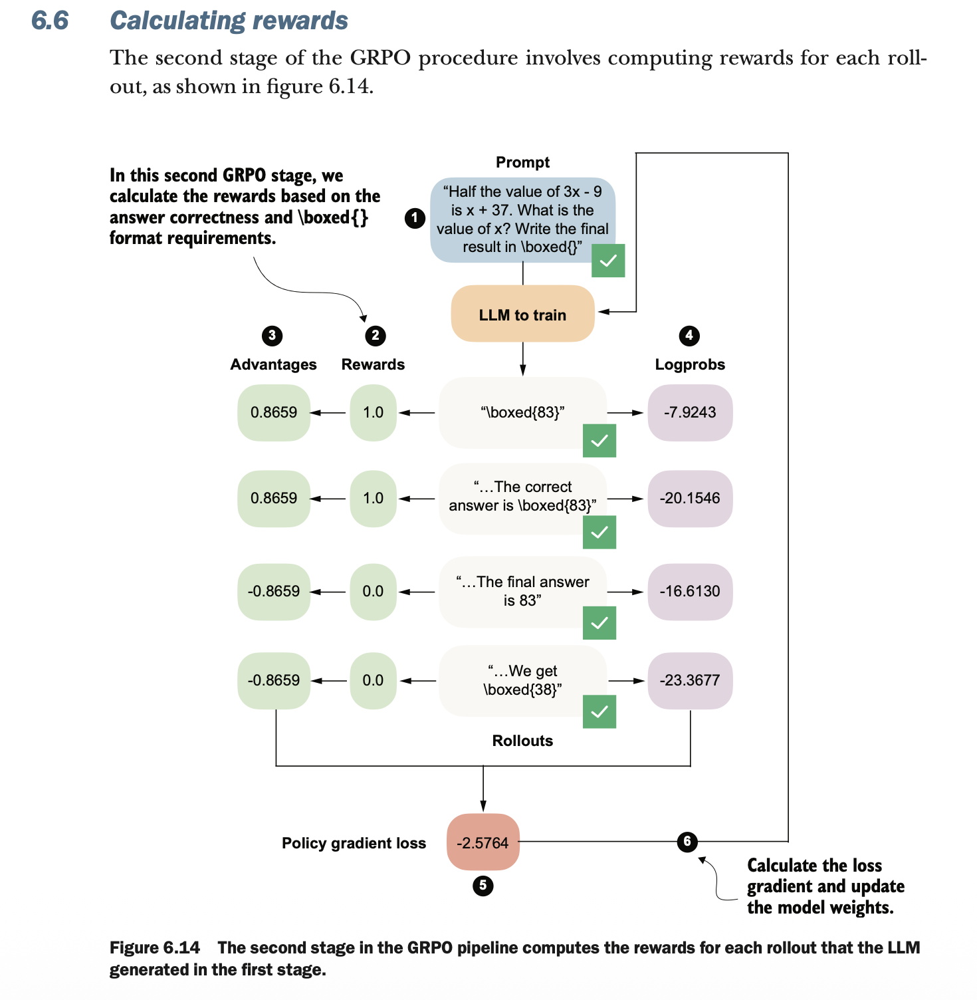


In [9]:
# Listing 6.6 Implementing the reward function

from reasoning_from_scratch.ch03 import extract_final_candidate, grade_answer


def reward_rlvr(answer_text, ground_truth):
    extracted = extract_final_candidate(answer_text, fallback=None)  # type: ignore # Require \boxed{}
    if not extracted:
        return 0.0
    correct = grade_answer(extracted, ground_truth)
    return float(correct)

In [10]:
# Listing 6.7 Applying the reward function to all rollouts

rollout_rewards = []
for answer in rollouts:
    reward = reward_rlvr(answer_text=answer, ground_truth="83")
    print(f"Answer: {answer!r}")
    print(f"Reward: {reward}\n")
    rollout_rewards.append(reward)

Answer: '\\boxed{83}'
Reward: 1.0

Answer: 'The correct answer is \\boxed{83}'
Reward: 1.0

Answer: 'The final answer is 83'
Reward: 0.0

Answer: 'We get \\boxed{38}'
Reward: 0.0



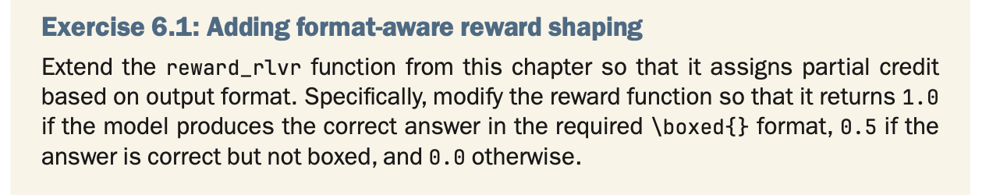


In [11]:
def partial_reward_rlvr(answer_text, ground_truth):

    boxed = extract_final_candidate(answer_text, fallback=None)  # type: ignore # Require \boxed{}

    if not boxed:
        correct = grade_answer(boxed, ground_truth)
        return 1.0 if correct else 0.0

    unboxed = extract_final_candidate(answer_text, fallback="number_then_full")

    if unboxed:
        correct = grade_answer(unboxed, ground_truth)
        return 0.5 if correct else 0.0

    return 0.0

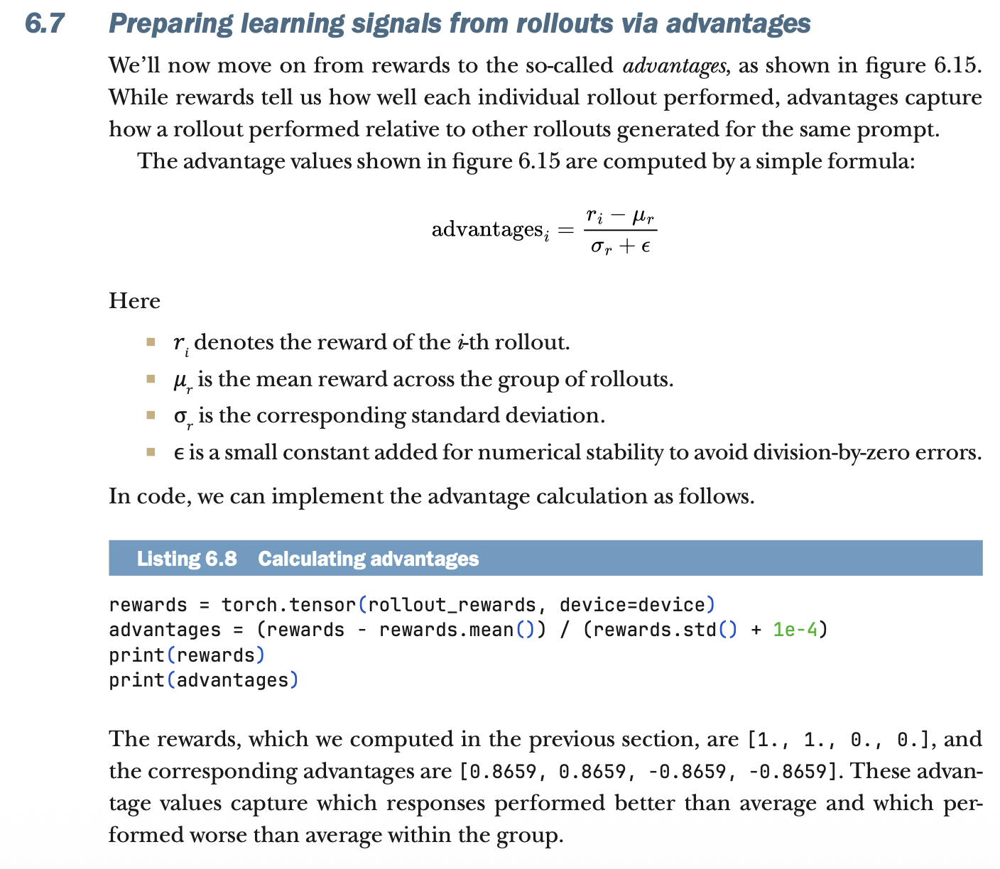


In [12]:
rewards = torch.tensor(rollout_rewards, device=device)
advantages = (rewards - rewards.mean()) / (rewards.std() + 1e-4)

print(rewards)
print(advantages)

tensor([1., 1., 0., 0.], device='mps:0')
tensor([ 0.8659,  0.8659, -0.8659, -0.8659], device='mps:0')


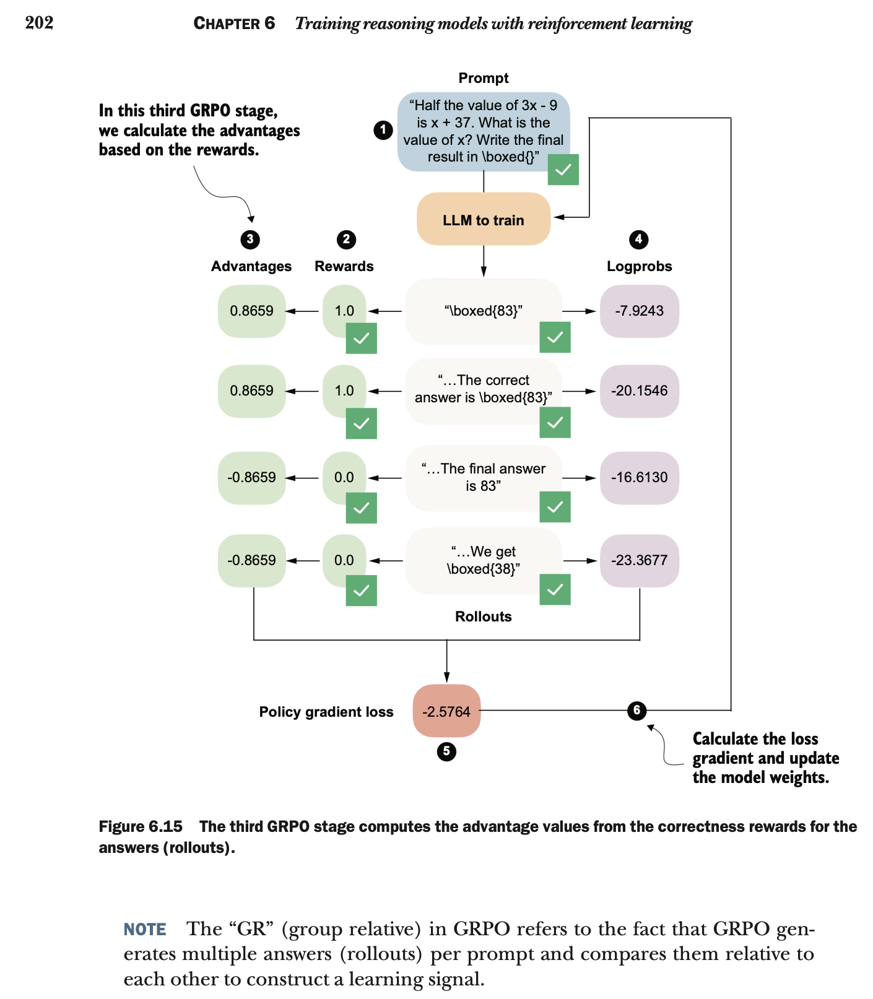


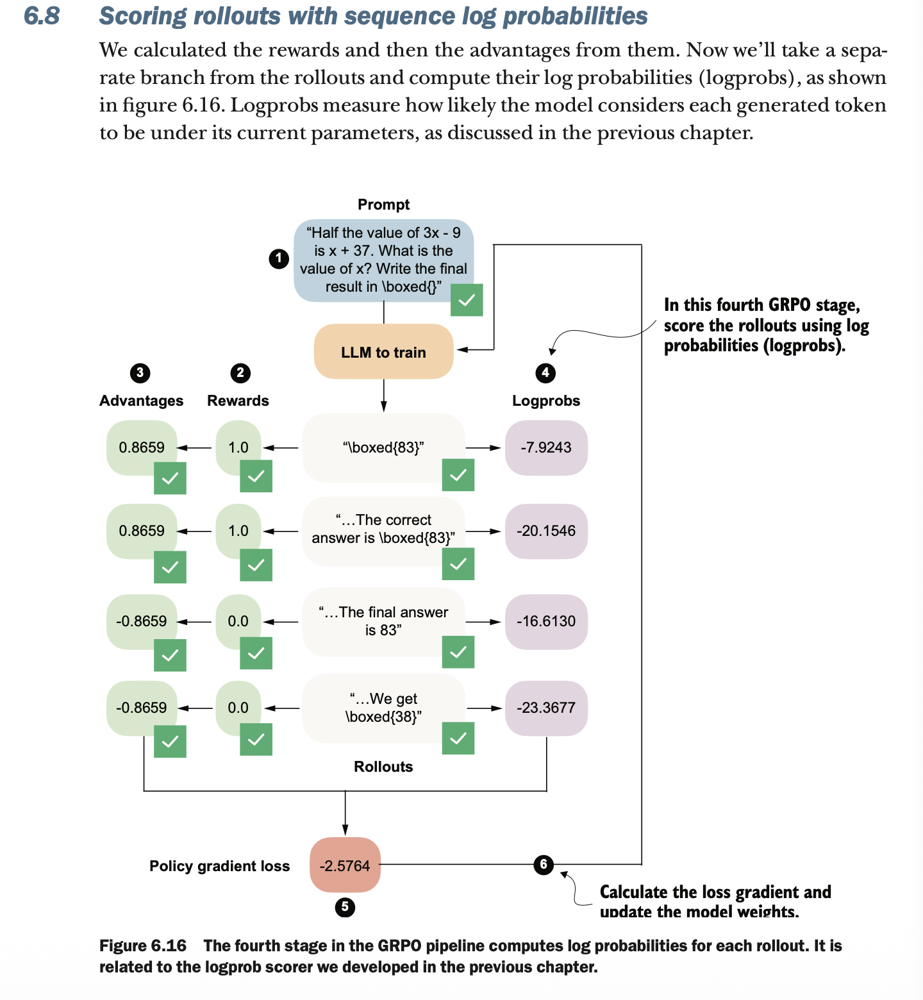


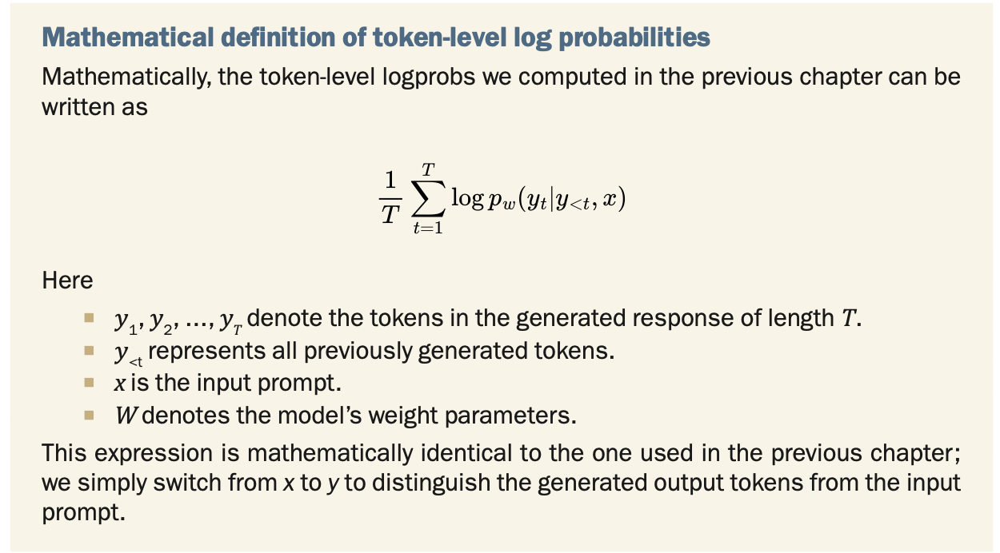


In [13]:
# Listing 6.9 Computing token-level log probabilities (similar to chapter 5)


@torch.inference_mode()
def avg_logprob_answer(model, tokenizer, prompt, answer, device="cpu"):

    # Encode prompt and answer tokens separately to get the prompt length later
    prompt_ids = tokenizer.encode(prompt)
    answer_ids = tokenizer.encode(answer)
    full_ids = torch.tensor(prompt_ids + answer_ids, device=device)

    # Same as in calc_next_token_logprobas before
    logits = model(full_ids.unsqueeze(0)).squeeze(0)
    logprobs = torch.log_softmax(logits, dim=-1)

    # Index range for positions corresponding to answer tokens
    start = len(prompt_ids) - 1
    end = full_ids.shape[0] - 1

    # Same as before, except for using start and end
    t_idx = torch.arange(start, end, device=device)
    next_tokens = full_ids[start + 1 : end + 1]
    next_token_logps = logprobs[t_idx, next_tokens]

    # Average over the answer token scores
    return torch.mean(next_token_logps).item()

In [14]:
avg_logprob_val = avg_logprob_answer(
    model, tokenizer, prompt=prompt, answer=answer_text, device=device  # type: ignore
)
print(avg_logprob_val)

-2.171875


In [15]:
sequence_logprob_val = avg_logprob_val * (len(tokenizer.encode(answer_text)))
print(sequence_logprob_val)

-8.6875


In [16]:
def sequence_logprob_draft(model, token_ids, prompt_len):
    logits = model(token_ids.unsqueeze(0)).squeeze(0).float()
    logprobs = torch.log_softmax(logits, dim=-1)

    # Positions whose next-token probabilities we want
    # These correspond to predicting token_ids[t + 1] from position t
    start = prompt_len - 1
    end = token_ids.shape[0] - 1

    t_idx = torch.arange(start, end, device=token_ids.device)
    next_tokens = token_ids[start + 1 : end + 1]
    next_token_logps = logprobs[t_idx, next_tokens]

    # Sum log-probabilities over the answer tokens
    return torch.sum(next_token_logps)


print(sequence_logprob_draft(model, token_ids, prompt_len))

tensor(-8.6623, device='mps:0', grad_fn=<SumBackward0>)


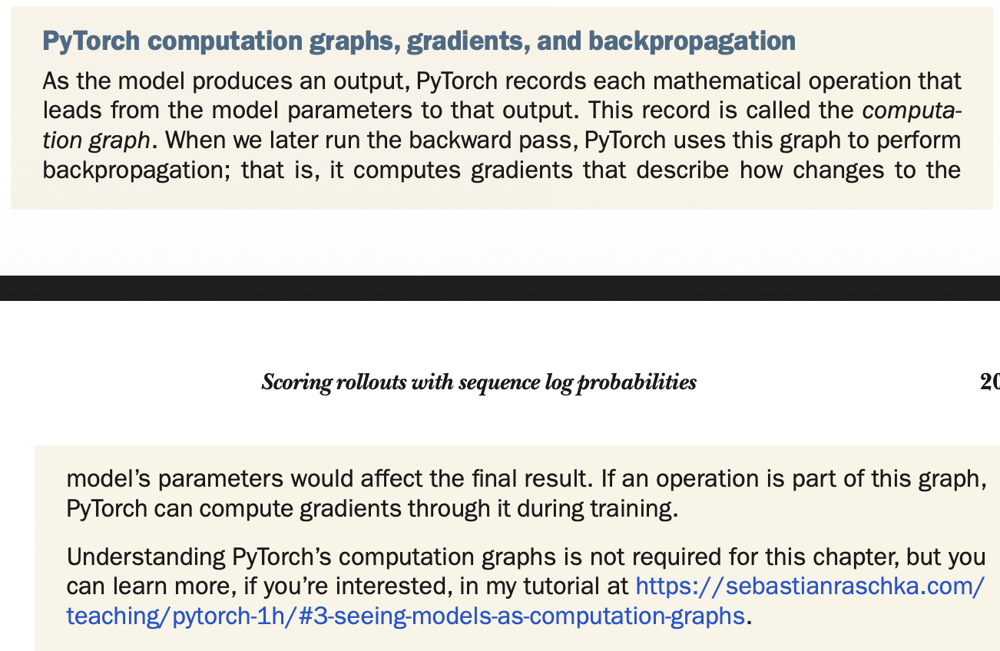


In [17]:
# Listing 6.11 Optimized sequence-level log probabilities code


def sequence_logprob(model, token_ids, prompt_len):
    logits = model(token_ids.unsqueeze(0)).squeeze(0).float()
    logprobs = torch.log_softmax(logits, dim=-1)
    selected = logprobs[:-1].gather(1, token_ids[1:].unsqueeze(-1)).squeeze(-1)
    return torch.sum(selected[prompt_len - 1 :])


print(sequence_logprob(model, token_ids, prompt_len))

tensor(-8.6623, device='mps:0', grad_fn=<SumBackward0>)


In [18]:
# Listing 6.12 Computing sequence-level log probabilities of all rollouts
rollouts = [
    r"\boxed{83}",
    r"The correct answer is \boxed{83}",
    r"The final answer is 83",
    r"We get \boxed{38}",
]

rollout_logps = []

for text in rollouts:
    token_ids = tokenizer.encode(prompt + " " + text)
    logprob = sequence_logprob(
        model=model,
        token_ids=torch.tensor(token_ids, device=device),
        prompt_len=prompt_len,
    )

    print(f"Answer:  {text}")
    print(f"Logprob: {logprob.item():.4f}\n")

    rollout_logps.append(logprob)

Answer:  \boxed{83}
Logprob: -8.0050

Answer:  The correct answer is \boxed{83}
Logprob: -19.9021

Answer:  The final answer is 83
Logprob: -16.0787

Answer:  We get \boxed{38}
Logprob: -23.3843



# From advantages to policy updates via the GRPO loss

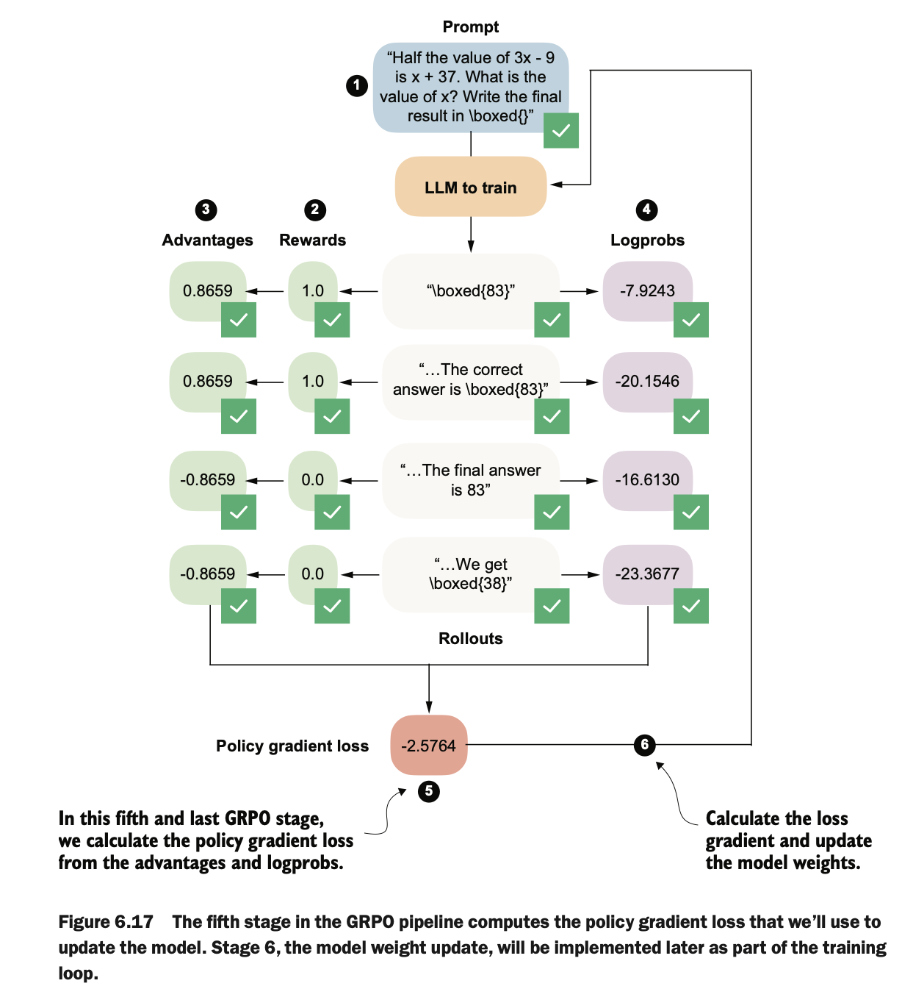


In [19]:
logps = torch.stack(rollout_logps)
pg_loss = -(advantages.detach() * logps).mean()

print(logps)
print(pg_loss)

tensor([ -8.0050, -19.9021, -16.0787, -23.3843], device='mps:0',
       grad_fn=<StackBackward0>)
tensor(-2.5015, device='mps:0', grad_fn=<NegBackward0>)


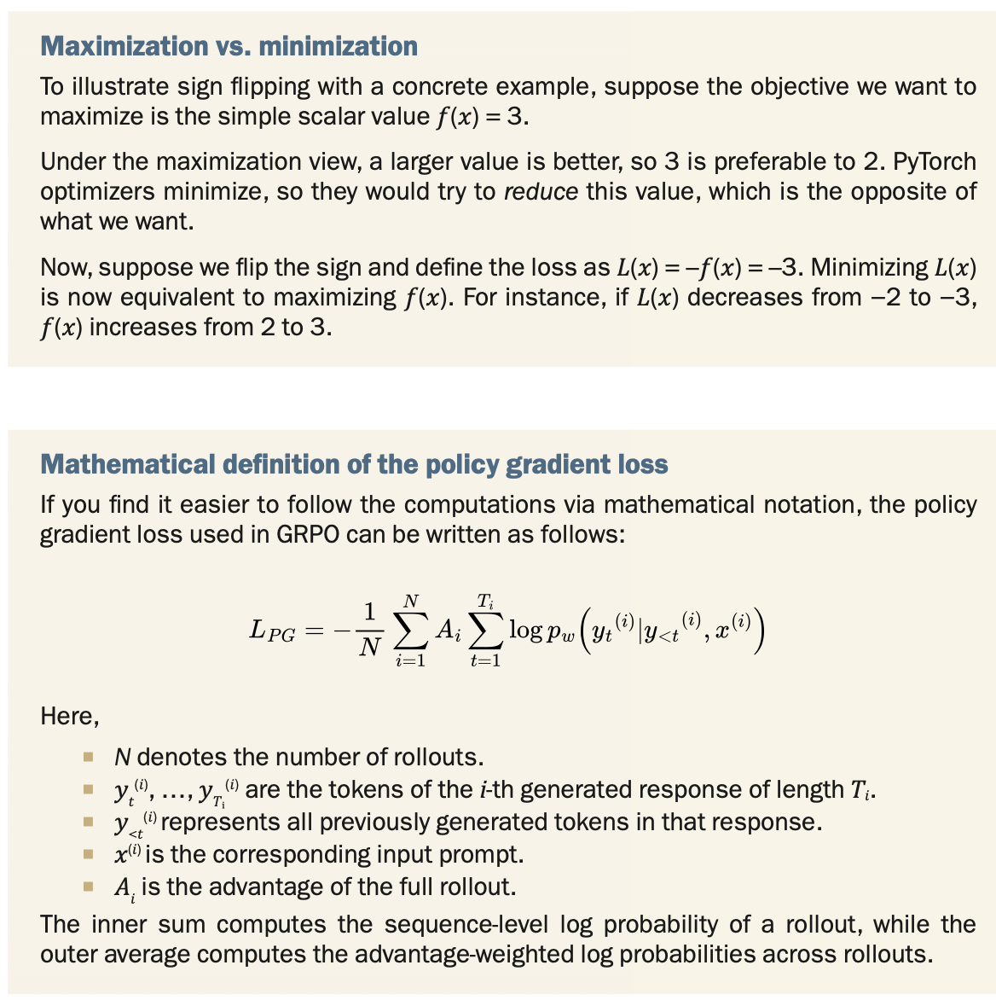


# 6.10 Putting everything together in a single GRPO function

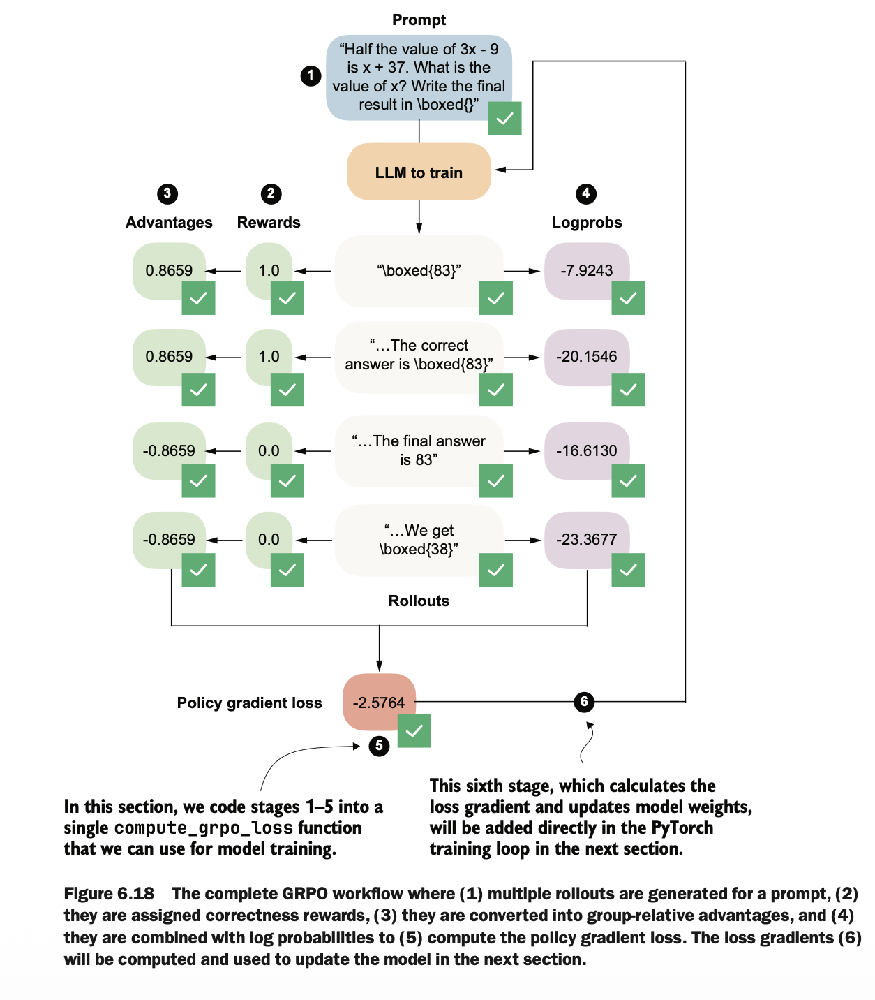


In [20]:
# Listing 6.14 Combining all the GRPO stages


def compute_grpo_loss(
    model,
    tokenizer,
    example,
    device,
    num_rollouts=2,
    max_new_tokens=256,
    temperature=0.8,
    top_p=0.9,
):
    assert num_rollouts >= 2
    roll_logps, roll_rewards, samples = [], [], []
    prompt = render_prompt(example["problem"])

    was_training = model.training
    model.eval()

    for _ in range(num_rollouts):
        # Stage 1: generate rollouts
        token_ids, prompt_len, text = sample_response(
            model=model,
            tokenizer=tokenizer,
            prompt=prompt,
            device=device,
            max_new_tokens=max_new_tokens,
            temperature=temperature,
            top_p=top_p,
        )
        # Stage 2: compute rewards
        reward = reward_rlvr(text, example["answer"])

        # Stage 4: compute logprobs
        logp = sequence_logprob(model, token_ids, prompt_len)

        roll_logps.append(logp)
        roll_rewards.append(reward)
        samples.append(
            {
                "text": text,
                "reward": reward,
                "gen_len": token_ids.numel() - prompt_len,
            }
        )

    if was_training:
        model.train()

    # Stage 2: collect all rewards
    rewards = torch.tensor(roll_rewards, device=device)

    # Stage 3: compute advantages
    advantages = (rewards - rewards.mean()) / (rewards.std() + 1e-4)

    # Stage 4: collect all logprobs
    logps = torch.stack(roll_logps)

    # Stage 5: compute policy gradient loss
    pg_loss = -(advantages.detach() * logps).mean()
    loss = pg_loss  # In the next chapter we add a KL term here

    return {
        "loss": loss.item(),
        "pg_loss": pg_loss.item(),
        "rewards": roll_rewards,
        "advantages": advantages.detach().cpu().tolist(),
        "samples": samples,
        "loss_tensor": loss,
    }

In [21]:
# Listing 6.15 Computing GRPO stages on a MATH training example

torch.manual_seed(123)
stats = compute_grpo_loss(
    model=model,
    tokenizer=tokenizer,
    example=math_train[4],
    device=device,
    num_rollouts=2,
    max_new_tokens=256,
    temperature=0.8,
    top_p=0.9,
)
pprint(stats)

{'advantages': [0.0, 0.0],
 'loss': -0.0,
 'loss_tensor': tensor(-0., device='mps:0', grad_fn=<NegBackward0>),
 'pg_loss': -0.0,
 'rewards': [0.0, 0.0],
 'samples': [{'gen_len': 256,
              'reward': 0.0,
              'text': ' 14\n'
                      'Step-by-step explanation:\n'
                      'To solve this problem, we can set up an equation based '
                      'on the information given. Let x be the number of days '
                      'Sam worked and y be the number of days he did not work. '
                      'We know that x + y = 20 (since he worked for 20 days). '
                      'We also know that Sam earned a total of $660 at the end '
                      'of the 20-day period. We can set up the equation:\n'
                      '\n'
                      '60x - 30y = 660\n'
                      '\n'
                      'Now we can solve for x:\n'
                      '\n'
                      '60x = 660 + 30y\n'
              

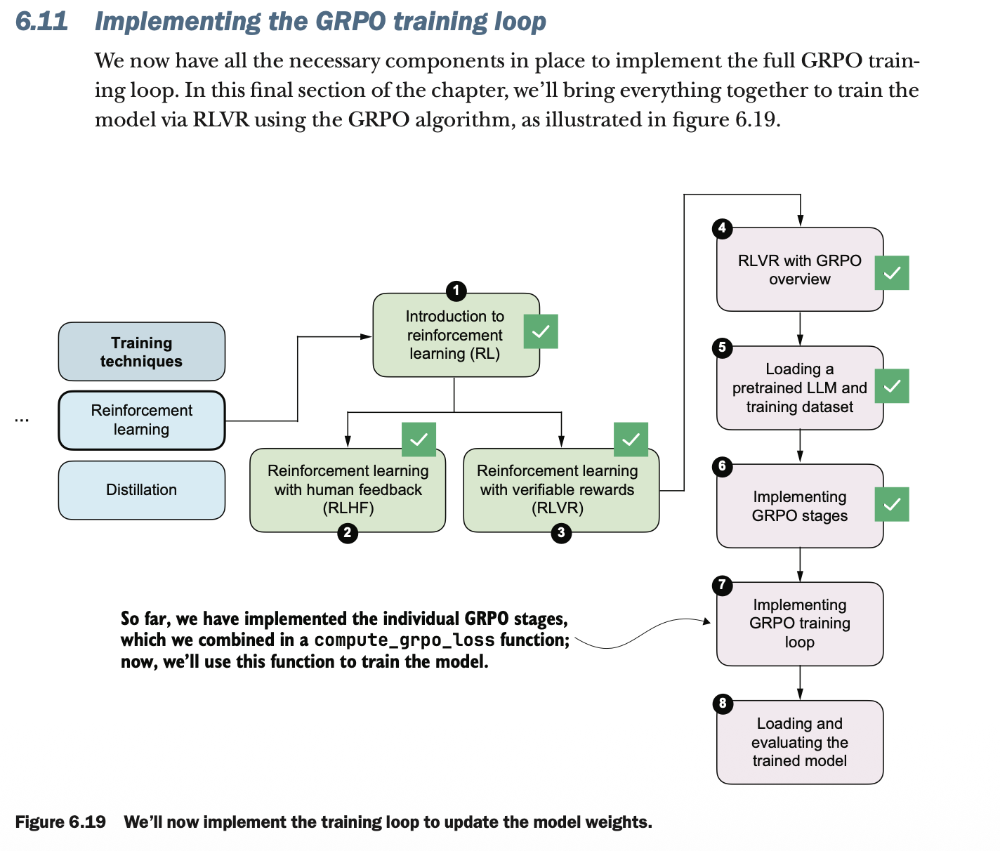
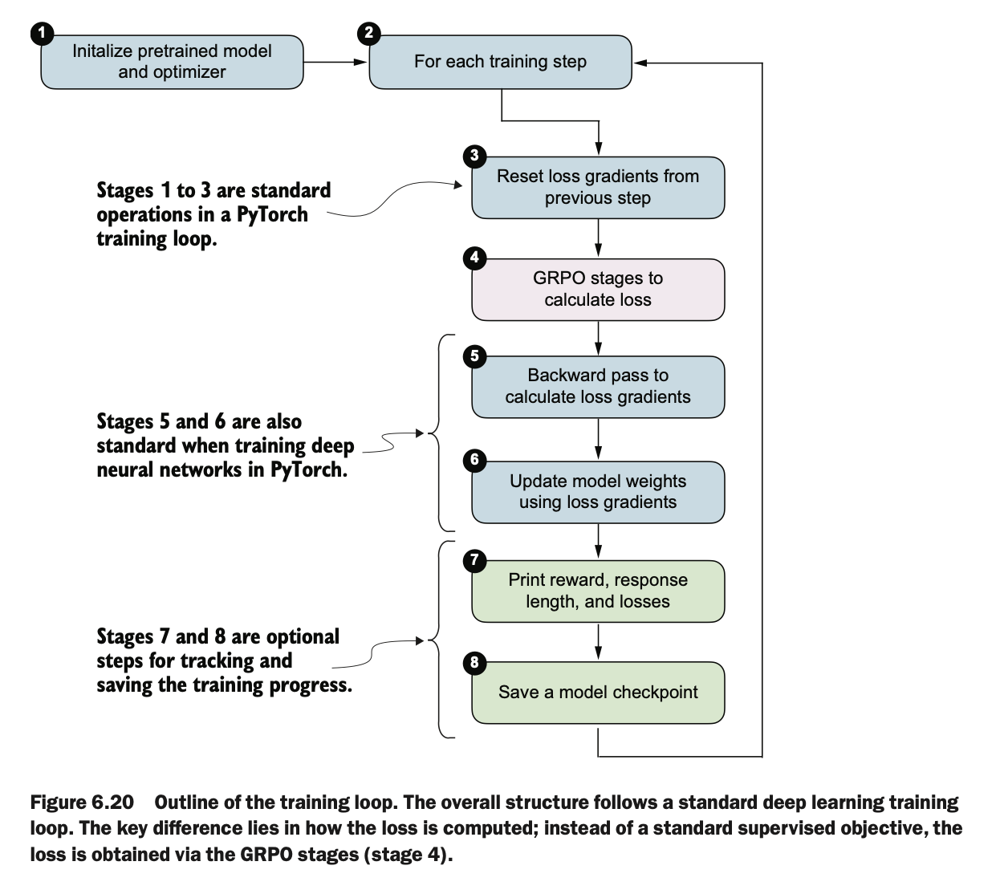


In [22]:
# Listing 6.16 Implementing the RLVR training loop

import time


def train_rlvr_grpo(
    model,
    tokenizer,
    math_data,
    device,
    steps=None,
    num_rollouts=2,
    max_new_tokens=256,
    temperature=0.8,
    top_p=0.9,
    lr=1e-5,
    checkpoint_every=50,
    checkpoint_dir=".",
    csv_log_path=None,
):
    if steps is None:
        steps = len(math_data)

    # Stage 1: initialize optimizer
    # (the model was already initialized outside the function)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
    model.train()
    current_step = 0
    if csv_log_path is None:
        timestamp = time.strftime("%Y%m%d_%H%M%S")
        csv_log_path = f"train_rlvr_grpo_metrics_{timestamp}.csv"
    csv_log_path = Path(csv_log_path)

    try:
        # Stage 2: Iterate over training steps
        for step in range(steps):

            # Stage 3: Reset loss gradient
            # (it's best practice to do this at the beginning of each step)
            optimizer.zero_grad()

            current_step = step + 1
            example = math_data[step % len(math_data)]

            # Stage 4: calculate GRPO loss
            stats = compute_grpo_loss(
                model=model,
                tokenizer=tokenizer,
                example=example,
                device=device,
                num_rollouts=num_rollouts,
                max_new_tokens=max_new_tokens,
                temperature=temperature,
                top_p=top_p,
            )

            # Stage 5: Backward pass to calculate loss gradients
            stats["loss_tensor"].backward()

            # Clip large gradients to improve training stability
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

            # Stage 6: Update model weights using loss gradients
            optimizer.step()

            # Stage 7: Collect rewards, response lengths, and losses
            reward_avg = torch.tensor(stats["rewards"]).mean().item()
            step_tokens = sum(sample["gen_len"] for sample in stats["samples"])
            avg_response_len = (
                step_tokens / len(stats["samples"]) if stats["samples"] else 0.0
            )
            append_csv_metrics(
                csv_log_path,
                current_step,
                steps,
                stats["loss"],
                reward_avg,
                avg_response_len,
            )

            # Print step metrics
            print(
                f"[Step {current_step}/{steps}] "
                f"loss={stats['loss']:.4f} "
                f"reward_avg={reward_avg:.3f} "
                f"avg_resp_len={avg_response_len:.1f}"
            )

            # Sample outputs (every 10 steps) to check if model
            # generates coherent text
            if current_step % 10 == 0:
                print(f"[Step {current_step}] sample outputs")
                for i, sample in enumerate(stats["samples"][:3]):
                    text = sample["text"].replace("\n", "\\n")
                    print(
                        f"  {i+1}) reward={sample['reward']:.3f} "
                        f"len={sample['gen_len']}: {text}"
                    )
                print()

            # Stage 8: Save model checkpoint
            if checkpoint_every and current_step % checkpoint_every == 0:
                ckpt_path = save_checkpoint(
                    model=model,
                    checkpoint_dir=checkpoint_dir,
                    step=current_step,
                )
                print(f"Saved checkpoint to {ckpt_path}")

    # Save a model checkpoint if we interrupt the training early
    except KeyboardInterrupt:
        ckpt_path = save_checkpoint(
            model=model,
            checkpoint_dir=checkpoint_dir,
            step=max(1, current_step),
            suffix="interrupt",
        )
        print(f"\nKeyboardInterrupt. Saved checkpoint to {ckpt_path}")
        return model

    return model


def save_checkpoint(model, checkpoint_dir, step, suffix=""):
    checkpoint_dir = Path(checkpoint_dir)
    checkpoint_dir.mkdir(parents=True, exist_ok=True)
    suffix = f"-{suffix}" if suffix else ""
    ckpt_path = checkpoint_dir / f"qwen3-0.6B-rlvr-grpo-step{step:05d}{suffix}.pth"
    torch.save(model.state_dict(), ckpt_path)
    return ckpt_path


def append_csv_metrics(
    csv_log_path,
    step_idx,
    total_steps,
    loss,
    reward_avg,
    avg_response_len,
):
    if not csv_log_path.exists():
        csv_log_path.write_text(
            "step,total_steps,loss,reward_avg,avg_response_len\n",
            encoding="utf-8",
        )
    with csv_log_path.open("a", encoding="utf-8") as f:
        f.write(
            f"{step_idx},{total_steps},{loss:.6f},{reward_avg:.6f},"
            f"{avg_response_len:.6f}\n"
        )

In [23]:
import torch

device = get_device()
model.to(device)

Using Apple Silicon GPU (MPS)


Qwen3Model(
  (tok_emb): Embedding(151936, 1024)
  (trf_blocks): ModuleList(
    (0-27): 28 x TransformerBlock(
      (att): GroupedQueryAttention(
        (W_query): Linear(in_features=1024, out_features=2048, bias=False)
        (W_key): Linear(in_features=1024, out_features=1024, bias=False)
        (W_value): Linear(in_features=1024, out_features=1024, bias=False)
        (out_proj): Linear(in_features=2048, out_features=1024, bias=False)
        (q_norm): RMSNorm()
        (k_norm): RMSNorm()
      )
      (ff): FeedForward(
        (fc1): Linear(in_features=1024, out_features=3072, bias=False)
        (fc2): Linear(in_features=1024, out_features=3072, bias=False)
        (fc3): Linear(in_features=3072, out_features=1024, bias=False)
      )
      (norm1): RMSNorm()
      (norm2): RMSNorm()
    )
  )
  (final_norm): RMSNorm()
  (out_head): Linear(in_features=1024, out_features=151936, bias=False)
)

In [24]:
# train the model
torch.manual_seed(0)

# train_rlvr_grpo(
#     model=model,
#     tokenizer=tokenizer,
#     math_data=math_train,
#     device=device,
#     steps=50,
#     num_rollouts=2,
#     max_new_tokens=512,
#     temperature=0.8,
#     top_p=0.9,
#     lr=1e-5,
#     checkpoint_every=5,
#     checkpoint_dir=".",
#     csv_log_path="train_rlvr_grpo_metrics.csv",
# )

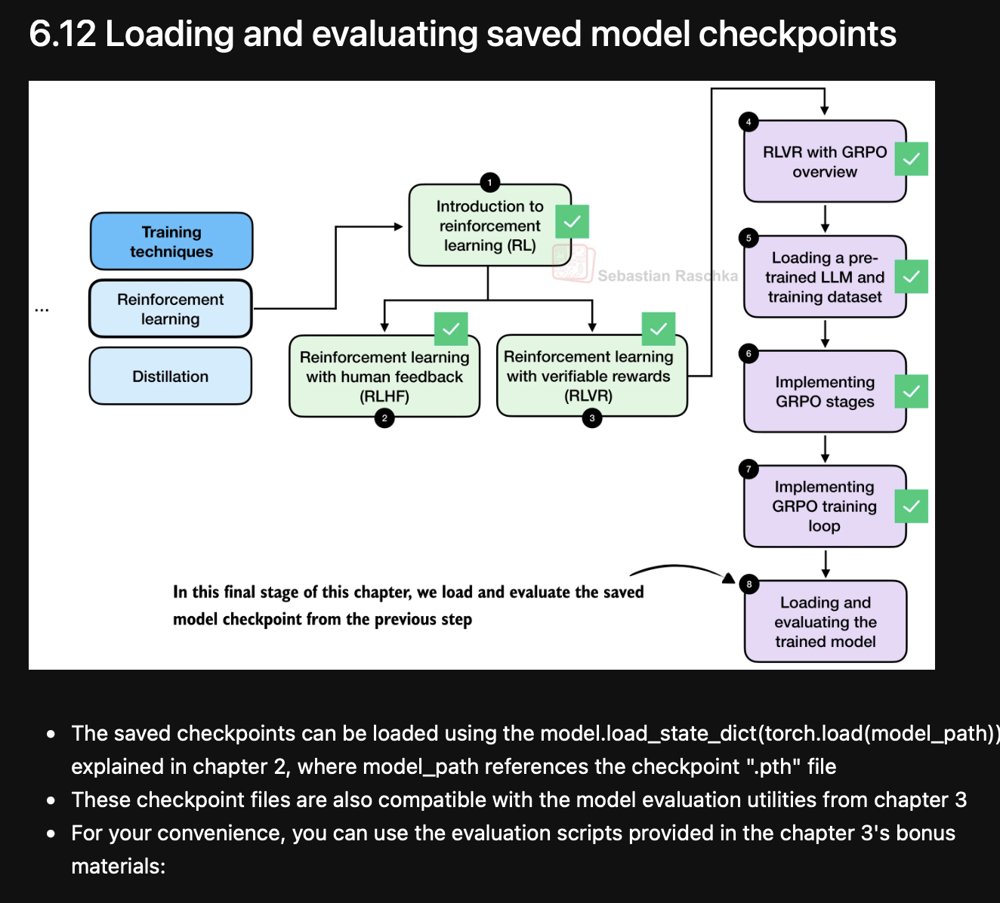


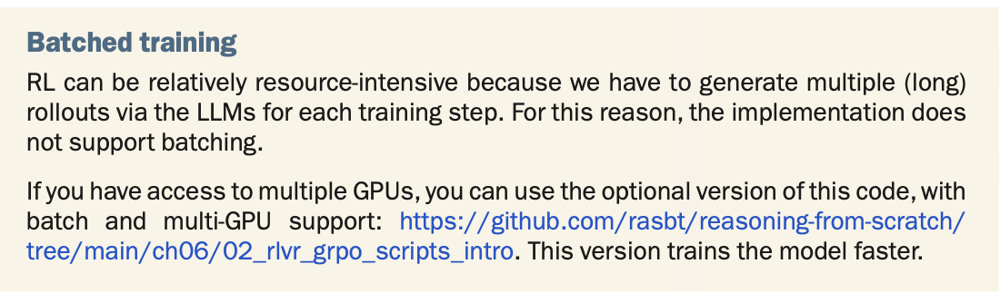


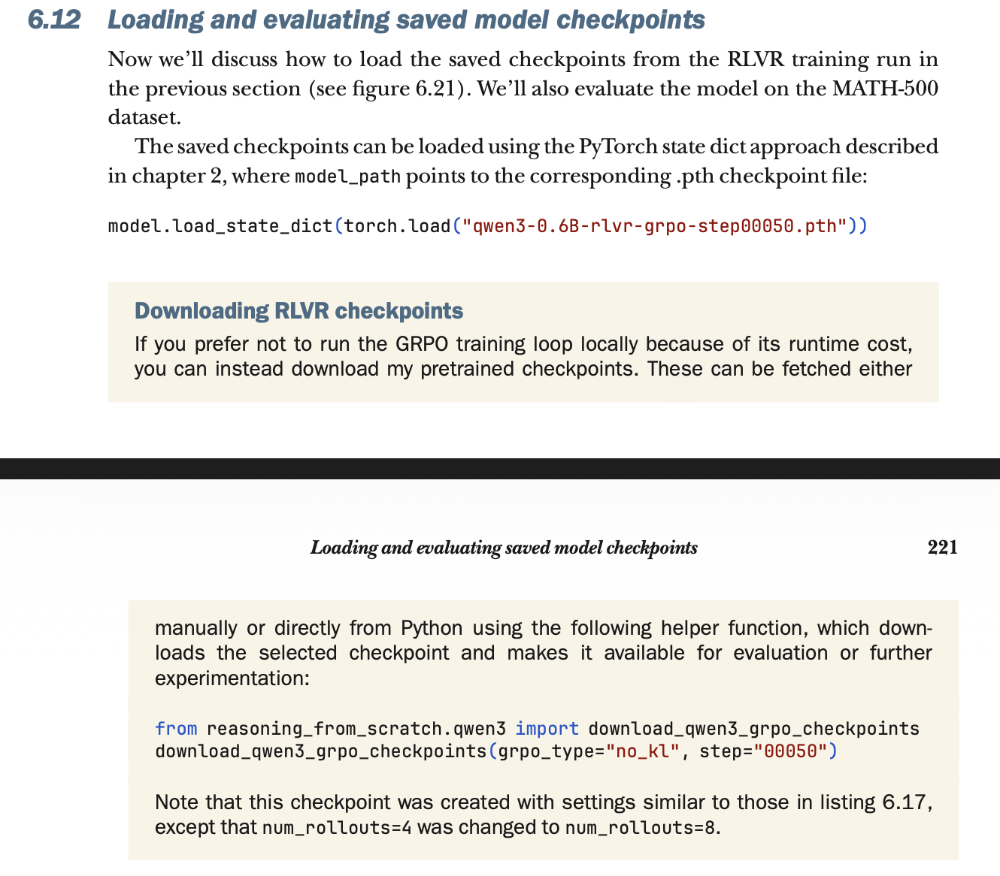


In [ ]:
from reasoning_from_scratch.qwen3 import download_qwen3_grpo_checkpoints

download_qwen3_grpo_checkpoints(grpo_type="no_kl", step="00050")

qwen3-0.6B-rlvr-grpo-step00050.pth:  90% (1291 MiB / 1433 MiB)

For convenience, you can reuse the evaluation script provided in the chapter 3
bonus materials (https:/ /github.com/rasbt/reasoning-from-scratch/blob/main/
ch03/02_math500-verifier-scripts/evaluate_math500.py) to run evaluations on the
MATH-500 dataset by specifying the desired checkpoint path. For example, to evaluate
the qwen3-0.6B-rlvr-grpo-step00050.pth checkpoint file, you can run the aforemen-
tioned script as follows:

- py run evaluate_math500.py \
  -- dataset_size 500 \
  -- which_model base \
  -- checkpoint_path "qwen3-0.6B-rlvr-grpo-step00050.pth"


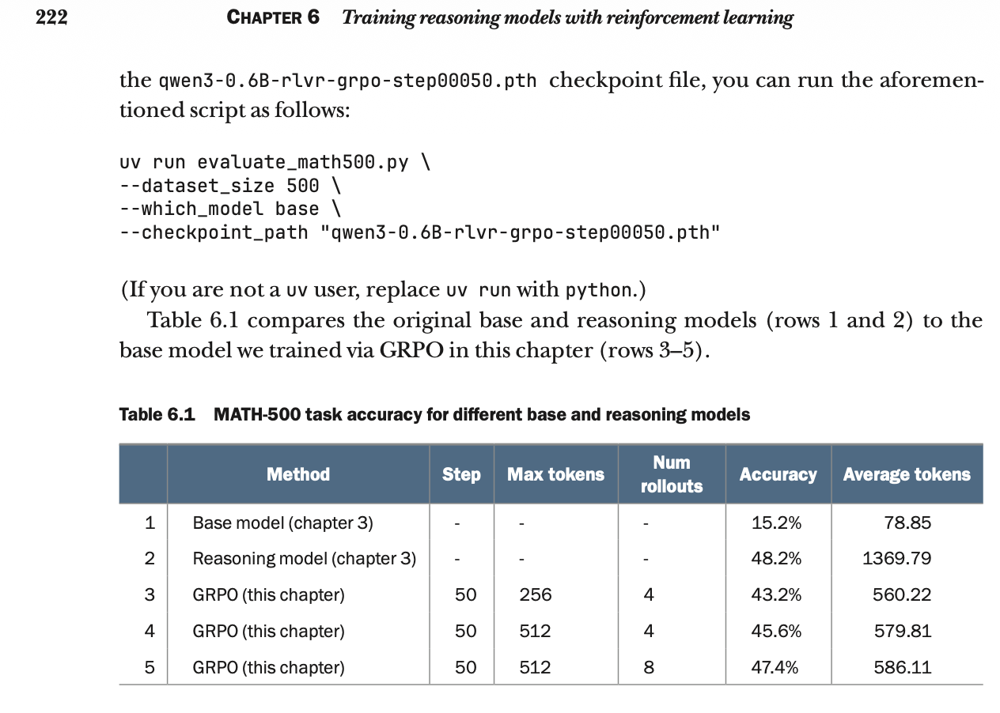

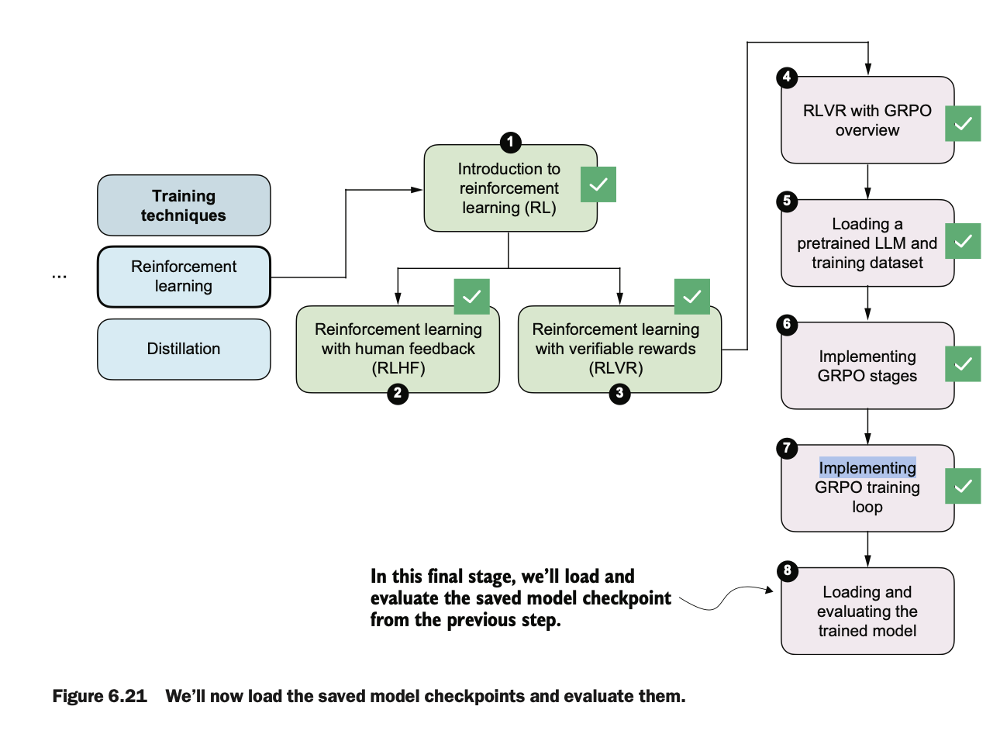
